# <center>Noisy and Low Light Image Enhancement with CNN</center>

*The goal of the project is to develop a computer vision system that can enhance low light and noisy images. Specifically, given an input image containing a region of interest (ROI) that is dark and/or noisy, the system should be able to produce an enhanced image of that ROI that is visually pleasing and improves the overall image quality. The system will utilize various image processing and deep learning techniques to achieve this goal. Additionally, the system will be able to handle input images of varying sizes and resolutions. Overall, the system aims to improve the usability and visual quality of low light and noisy images in a variety of real-world applications.*

## Group: 03
* Arpit Gour

In [ ]:
import numpy as np
import pandas as pd
import os
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib as mpl
import tensorflow as tf
from keras.preprocessing import image
from keras import backend as K
from keras.layers import add, Conv2D,MaxPooling2D,UpSampling2D,Input,BatchNormalization, RepeatVector, Reshape
from keras.layers import Dense, Dropout, Concatenate,Reshape, Conv2DTranspose,Conv2D, MaxPooling2D, LeakyReLU, UpSampling2D, Lambda
from keras.layers.merge import concatenate
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from tensorflow import set_random_seed
set_random_seed(2)
np.random.seed(1)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
print(os.listdir("../input"))

mpl.rcParams['font.size'] = 10 # Set font size to 10
mpl.rcParams['axes.edgecolor'] = 'white' # Set axis edge color to white
mpl.rcParams['xtick.color'] = 'white' # Set x-axis tick color to white
mpl.rcParams['ytick.color'] = 'white' # Set y-axis tick color to white


In [ ]:
InputPath="../input/image-classification/images/images/art and culture/"

In [ ]:
def noisy(image, noise_typ = "s&p"):
    if noise_typ == "gauss":
        row,col,ch= image.shape
        mean = 0
        var = 0.0001
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy =  gauss + image
        return noisy
    elif noise_typ == "s&p":
        row,col,ch = image.shape
        s_vs_p = 0.5
        amount = 1.0
        out = np.copy(image)
        # Salt mode
        num_salt = np.ceil(image.size * s_vs_p)
        coords = [np.random.randint(0, i, int(num_salt))
              for i in image.shape]
        out[coords] = 1

        # Pepper mode
        num_pepper = np.ceil(image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i , int(num_pepper))
              for i in image.shape]
        out[coords] = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy

## REAL IMAGE

255

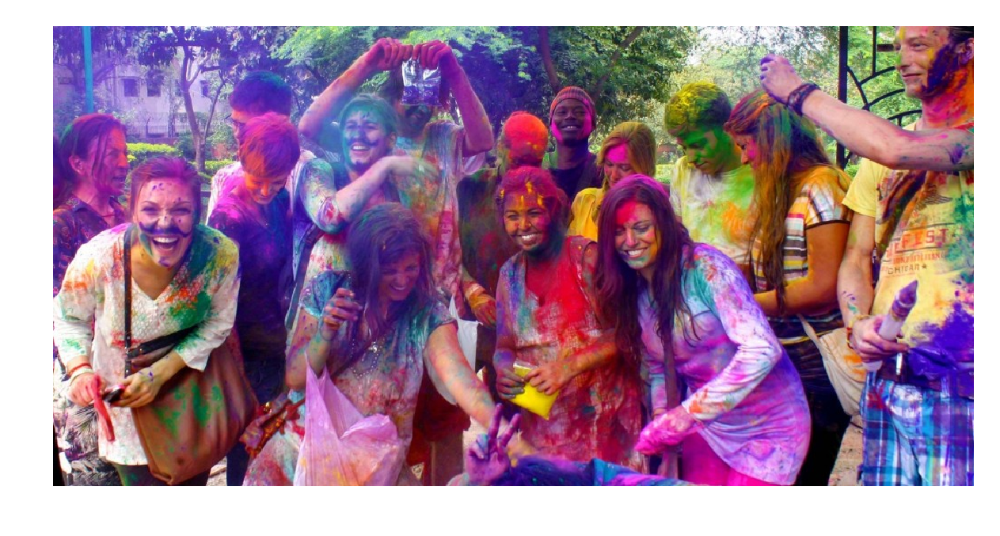

In [ ]:
img = cv.imread(InputPath+"0 (8).jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
l = img.max()
plt.imshow(img)
plt.axis('off')
l

## IMAGE WITH NOISE(SALT AND PEPPER NOISE)

(-0.5, 1023.5, 511.5, -0.5)

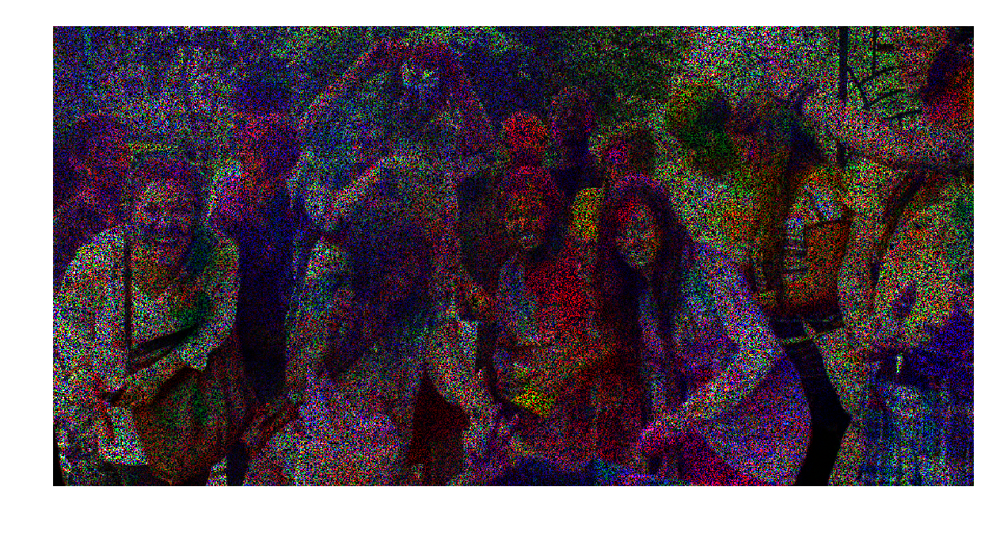

In [ ]:
Noise = noisy(img)
plt.imshow(Noise)
plt.axis('off')

  ## IMAGE WITH LOW-BRIGHTNESS AND SALT-PEPPER NOISE TO GET THE PERFECT LOW-LIGHT IMAGE

(-0.5, 1023.5, 511.5, -0.5)

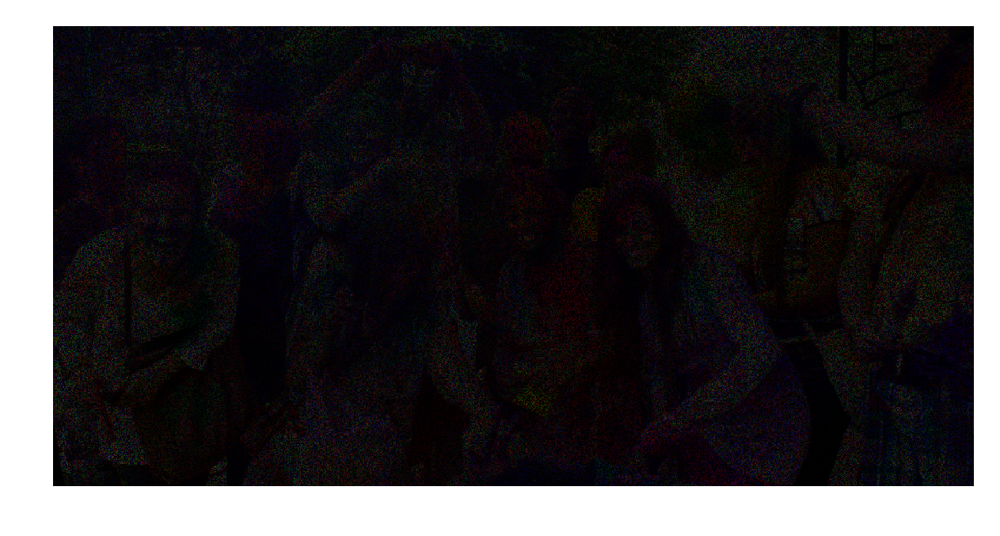

In [ ]:
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV) #convert it to hsv
hsv[...,2] = hsv[...,2]*0.2
img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
Noise2 = noisy(img1)

plt.imshow(Noise2)
plt.axis('off')

In [ ]:
def PreProcessData(ImagePath):
    X_=[]
    y_=[]
    count=0
    for imageDir in os.listdir(ImagePath):
        if count<2131:
            try:
                count=count+1
                img = cv.imread(ImagePath + imageDir)
                img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
                img_y = cv.resize(img,(500,500))
                hsv = cv.cvtColor(img_y, cv.COLOR_BGR2HSV) #convert it to hsv
                hsv[...,2] = hsv[...,2]*0.2
                img_1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
                Noisey_img = noisy(img_1)
                X_.append(Noisey_img)
                y_.append(img_y)
            except:
                pass
    X_ = np.array(X_)
    y_ = np.array(y_)

    return X_,y_

In [ ]:
X_,y_ = PreProcessData(InputPath)

In [ ]:
K.clear_session()
def InstantiateModel(in_):

    model_1 = Conv2D(16,(7,7), activation='relu',padding='same',strides=1)(in_)
    model_1 = Conv2D(64,(5,5), activation='relu',padding='same',strides=1)(model_1)
    model_1 = Conv2D(128,(3,3), activation='relu',padding='same',strides=1)(model_1)

    model_2 = Conv2D(64,(3,3), activation='relu',padding='same',strides=1)(in_)
    model_2 = Conv2D(128,(3,3), activation='relu',padding='same',strides=1)(model_2)

    model_2_0 = Conv2D(128,(3,3), activation='relu',padding='same',strides=1)(model_2)

    model_add = add([model_1,model_2,model_2_0])


    model_3 = Conv2D(128,(3,3), activation='relu',padding='same',strides=1)(model_add)
    model_3 = Conv2D(64,(3,3), activation='relu',padding='same',strides=1)(model_3)
    model_3 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_3)

    model_3_1 = Conv2D(64,(3,3), activation='relu',padding='same',strides=1)(model_add)
    model_3_1 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_3_1)

    model_3_2 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_add)

    model_add_2 = add([model_3_1,model_3_2,model_3])

    model_4 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_add_2)
    model_4_1 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_add)

    model_add_3 = add([model_4_1,model_add_2,model_4])

    model_5 = Conv2D(16,(3,3), activation='relu',padding='same',strides=1)(model_add_3)

    model_5 = Conv2D(3,(3,3), activation='relu',padding='same',strides=1)(model_5)

    return model_5


In [ ]:
Input_Sample = Input(shape=(500, 500,3))
Output_ = InstantiateModel(Input_Sample)
Model_Enhancer = Model(inputs=Input_Sample, outputs=Output_)

In [ ]:
def peak_signal_noise_ratio(y_true, y_pred):
    return tf.image.psnr(y_pred, y_true, max_val=255.0)

Model_Enhancer.compile(optimizer= 'adam', loss='mse', metrics=[peak_signal_noise_ratio])

Model_Enhancer.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 500, 500, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 500, 500, 16) 2368        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 500, 500, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 500, 500, 64) 25664       conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_5 (

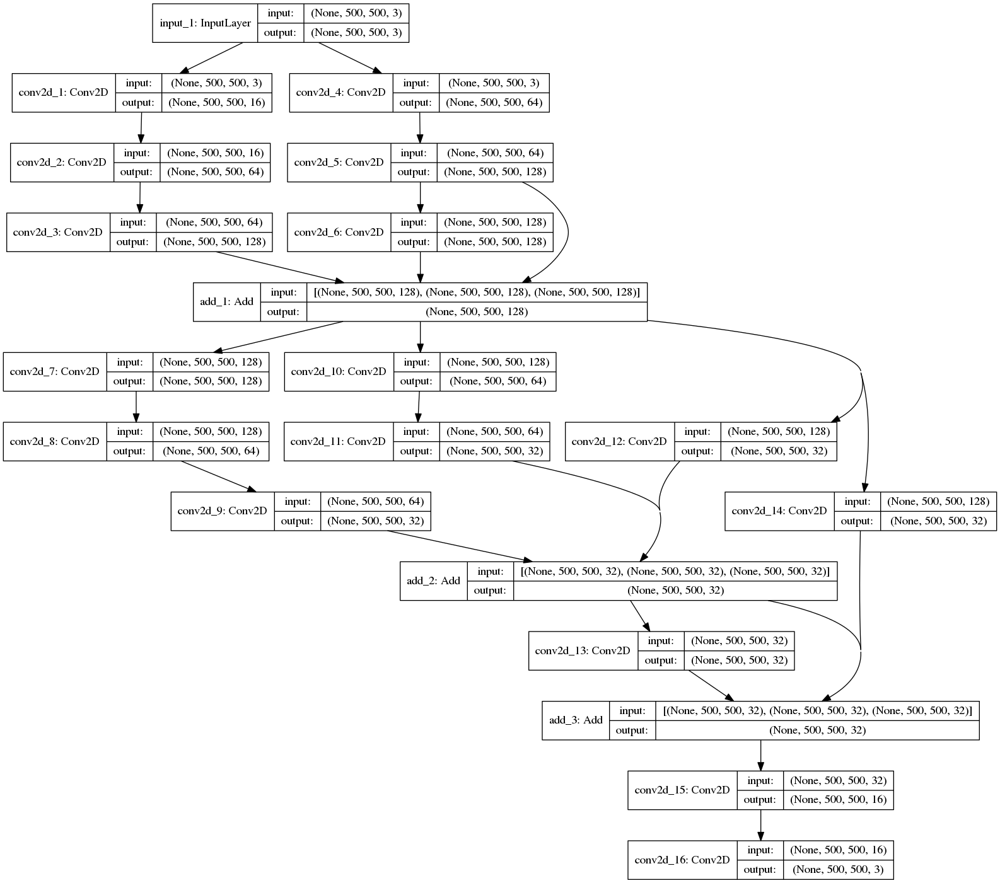

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(Model_Enhancer,to_file='model_.png',show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image(retina=True, filename='model_.png')

In [ ]:
def GenerateInputs(X,y):
    for i in range(len(X)):
        X_input = X[i].reshape(1,500,500,3)
        y_input = y[i].reshape(1,500,500,3)
        yield (X_input,y_input)
history = Model_Enhancer.fit_generator(GenerateInputs(X_,y_),epochs=50,verbose=1,steps_per_epoch=40,shuffle=True)

Epoch 1/50
40/40 [==============================] - 11s 282ms/step - loss: 4939.5634 - peak_signal_noise_ratio: 12.7011
Epoch 2/50
40/40 [==============================] - 6s 147ms/step - loss: 1971.4712 - peak_signal_noise_ratio: 16.3150
Epoch 3/50
40/40 [==============================] - 6s 146ms/step - loss: 1534.9274 - peak_signal_noise_ratio: 17.4476
Epoch 4/50
40/40 [==============================] - 6s 148ms/step - loss: 1773.2822 - peak_signal_noise_ratio: 16.6421
Epoch 5/50
40/40 [==============================] - 6s 146ms/step - loss: 1582.5761 - peak_signal_noise_ratio: 17.6216
Epoch 6/50
40/40 [==============================] - 6s 147ms/step - loss: 1553.2272 - peak_signal_noise_ratio: 17.5089
Epoch 7/50
40/40 [==============================] - 6s 146ms/step - loss: 1317.2010 - peak_signal_noise_ratio: 18.4052
Epoch 8/50
40/40 [==============================] - 6s 146ms/step - loss: 1306.7771 - peak_signal_noise_ratio: 18.0238
Epoch 9/50
40/40 [=============================

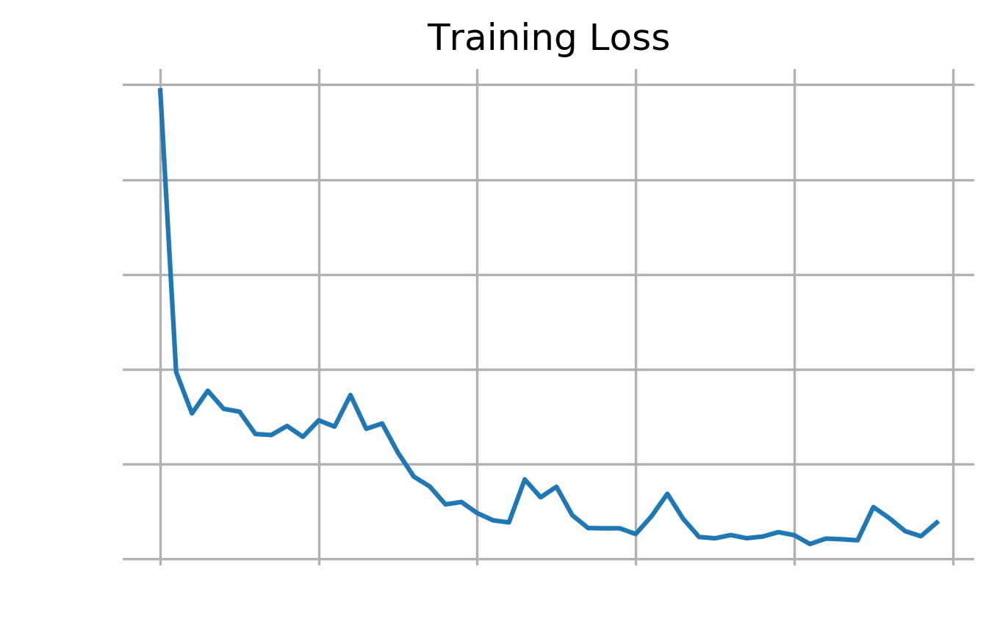

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Training Loss')
plt.grid()

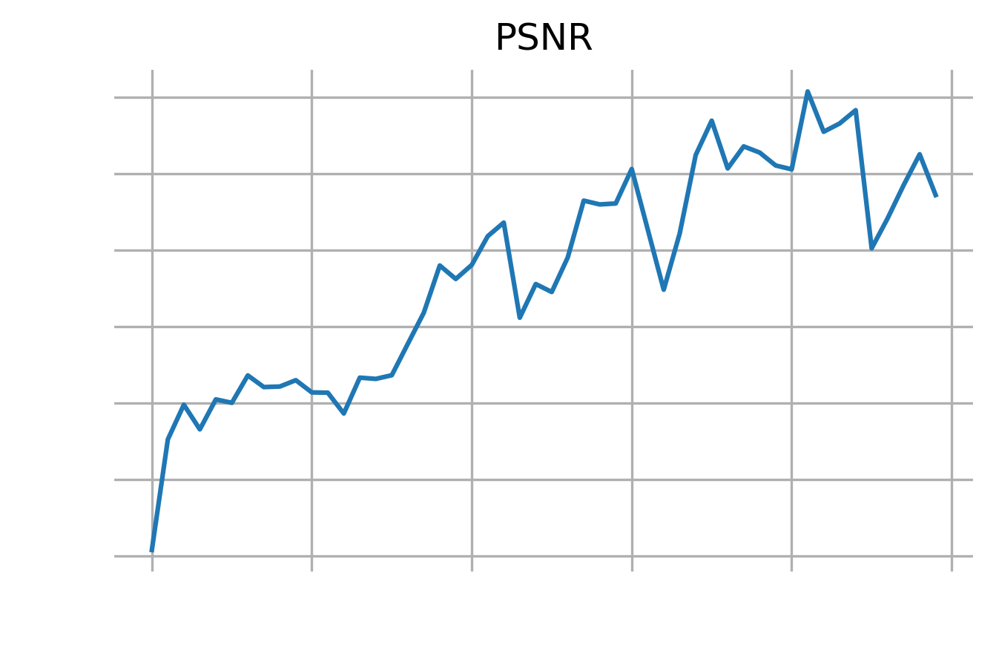

In [ ]:
plt.plot(history.history['peak_signal_noise_ratio'], label='PSNR')
plt.title('PSNR')
plt.grid()

In [ ]:
Model_Enhancer.save('my_model.h5')

In [ ]:
TestPath="../input/image-classification/validation/validation/art and culture/"

In [ ]:
def ExtractTestInput(ImagePath):
    img = cv.imread(ImagePath)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_ = cv.resize(img,(500,500))
    hsv = cv.cvtColor(img_, cv.COLOR_BGR2HSV) #convert it to hsv
    hsv[...,2] = hsv[...,2]*0.2
    img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
    Noise = noisy(img1)
    Noise = Noise.reshape(1,500,500,3)
    return Noise

In [ ]:
ImagePath=TestPath+"0013.jpg"
image_for_test = ExtractTestInput(ImagePath)
Prediction = Model_Enhancer.predict(image_for_test)

In [ ]:
mpl.rcParams['axes.spines.left'] = False # Turn off the left axis
mpl.rcParams['axes.spines.right'] = False # Turn off the right axis
mpl.rcParams['axes.spines.bottom'] = False # Turn off the bottom axis
mpl.rcParams['axes.spines.top'] = False # Turn off the top axis
mpl.rcParams['xtick.bottom'] = False # Turn off the xticks
mpl.rcParams['ytick.left'] = False # Turn off the yticks

In [ ]:
Prediction = Prediction.reshape(500,500,3)
#print(f'PSNR: {peak_signal_noise_ratio(image_for_test, Prediction).item()}')
plt.imshow((1/255)*Prediction)


In [ ]:
y_.shape

(2116, 500, 500, 3)

## COMPARATIVE ANALYSIS OF THE ENHANCED IMAGE WITH RESPECT TO GROUND TRUTH IMAGE

In [ ]:
def PSNR(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

PSNR: 34.24035766162481


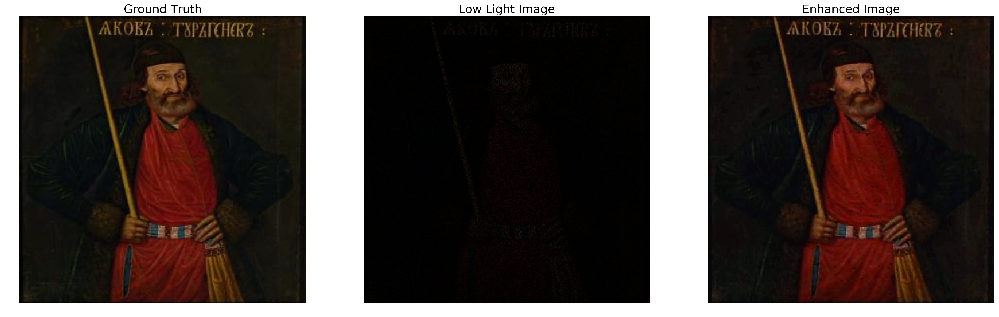

In [ ]:
Image_test=TestPath+"0013.jpg"
plt.figure(figsize=(30,30))
plt.subplot(1,3,1)
img_1 = cv.imread(Image_test)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)
plt.axis('off')

plt.subplot(1,3,2)
img_ = ExtractTestInput(Image_test)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)
plt.axis('off')

plt.subplot(1, 3, 3)
img_ = (1/255)*Prediction
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)
plt.axis('off')

print(f'PSNR: {PSNR(img_1, Prediction)}')

In [ ]:
TestPath2="../input/image-classification/validation/validation/travel and adventure/"

In [ ]:
Image_test2=TestPath2+"0.jpg"
plt.figure(figsize=(30,30))
plt.subplot(1, 3 ,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(1, 3, 2)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(1, 3, 3)
Prediction = Prediction.reshape(500,500,3)
img_ = (1/255)*Prediction
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)
print(f'PSNR: {PSNR(img_1, Prediction)}')

PSNR: 24.035582266818388


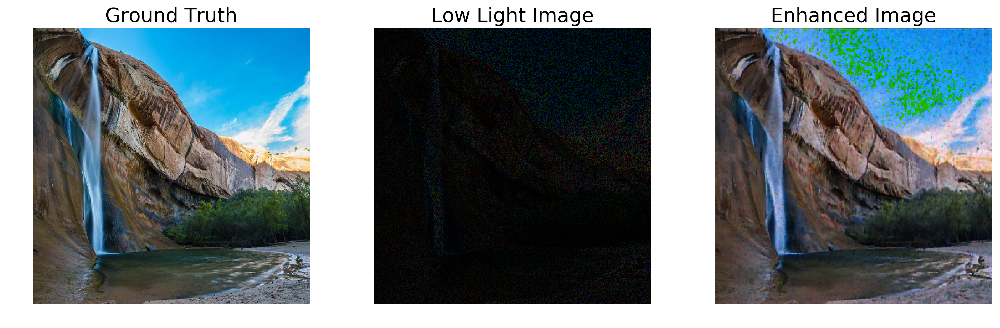

In [ ]:
Image_test2=TestPath2+"13.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)
print(f'PSNR: {PSNR(img_1, Prediction)}')

PSNR: 24.549929310076898


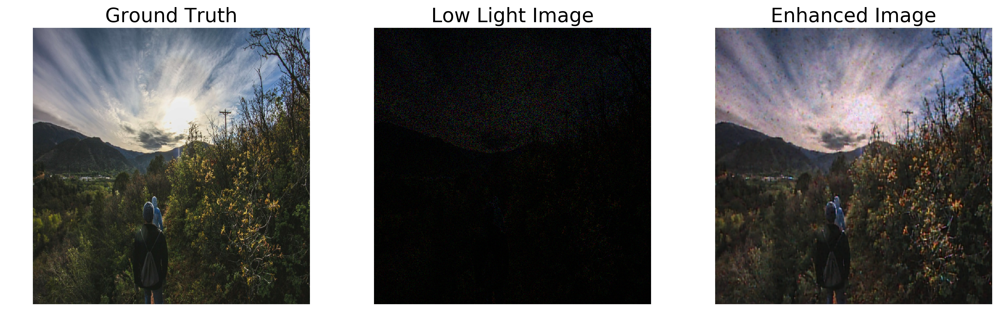

In [ ]:
Image_test2=TestPath2+"18.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)
print(f'PSNR: {PSNR(img_1, Prediction)}')

In [ ]:
Image_test_dir='/kaggle/input/samples/'
for fle in os.listdir(Image_test_dir):
    plt.figure(figsize=(30,30))
    plt.subplot(5,5,1)
    img_1 = cv.imread(Image_test_dir+fle)
    img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
    img_1 = cv.resize(img_1, (500, 500))
    plt.title("Ground Truth",fontsize=20)
    plt.imshow(img_1)

    plt.subplot(5,5,1+1)
    img_ = ExtractTestInput(Image_test_dir+fle)
    Prediction = Model_Enhancer.predict(img_)
    img_ = img_.reshape(500,500,3)
    plt.title("Low Light Image",fontsize=20)
    plt.imshow(img_)

    plt.subplot(5,5,1+2)
    Prediction = Prediction.reshape(500,500,3)
    img_[:,:,:] = Prediction[:,:,:]
    plt.title("Enhanced Image",fontsize=20)
    print(f'PSNR: {PSNR(img_1, Prediction)}')
    plt.imshow(img_)

In [ ]:
Image_test2=TestPath2+"11.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)


In [ ]:
Image_test2=TestPath2+"10.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)


In [ ]:
Image_test2=TestPath2+"12.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)


In [ ]:
from tensorflow import keras
loaded_model = keras.models.load_model('/kaggle/working/my_model.h5', custom_objects={'peak_signal_noise_ratio': tf.image.psnr(_, _, max_val=255.0)})